# Quintiles, Panel Regression

# Project 10: Chapter 8: Advanced Data Analysis
In the last few chapters, we have become comfortable with the idea of building our own functions. These can become quite complex, as we have learned with the construction of the OLS regression in chapter 7. We will continue developing our tool set for working with and managing large sets of data by integrating data from different data sets. We will introduce the multi index to facilitate this process. Among other things, the multi index is useful for including identifiers across time and region or principality. We will also use the multi index to perform a panel regression that controls for level effects between different countries.

## Using a Double Index to Work with Panel Data
In any project, it will not be uncommon for data to be attached to more than one indentifying category. Often, data will be labeled by polity and by date. In the next several examples, we will work with multiple data sets of this sort, working to combine different data sets, investigate the features of the double index, and use this data in a panel regression that can control for effects by polity and by time period.

### Plotting with Double Index
We will be working with two datasets in the next example: the [Fraser Economic Freedom Index](https://www.fraserinstitute.org/economic-freedom/dataset?geozone=world&page=dataset&min-year=2&max-year=0&filter=0&year=2017) and GDP from the [Maddison Project](https://www.rug.nl/ggdc/historicaldevelopment/maddison/releases/maddison-project-database-2018).

Due to the formatting of the Fraser Economic Freedom Index, the first column and the first three rows of data in the sheet titled “EFW Index 2018 Report” are blank. We will account for this when importing the data with pandas. Both should be saved in the same folder as the script below.

First, import the GDP data from Maddison Project:

In [1]:
#multiIndex.py
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm

# index_col = [0,2] will select  countrycode as the primary index and year as 
# the secondary index
data = pd.read_csv("fraserDataWithRGDPPC.csv", index_col = ["ISO_Code_3","Year"], parse_dates = True).rename(columns = {"Summary":"EFW"})

In [2]:
data

ISO_Code_2   World Bank Region  \
ISO_Code_3 Year                                        
AGO        1970-01-01         AO  Sub-Saharan Africa   
           1975-01-01         AO  Sub-Saharan Africa   
           1980-01-01         AO  Sub-Saharan Africa   
           1985-01-01         AO  Sub-Saharan Africa   
           1990-01-01         AO  Sub-Saharan Africa   
...                          ...                 ...   
ZWE        2016-01-01         ZW  Sub-Saharan Africa   
           2017-01-01         ZW  Sub-Saharan Africa   
           2018-01-01         ZW  Sub-Saharan Africa   
           2019-01-01         ZW  Sub-Saharan Africa   
           2020-01-01         ZW  Sub-Saharan Africa   

                      World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)  \
ISO_Code_3 Year                                                                                                                                              
AGO        1970-01-01                                                NaN                                                                                     
           1975-01-01                                                NaN                                                                                     
           1980-01-01                                                NaN                                                                                     
           1985-01-01                                                NaN                                                                                     
           1990-01-01                                                 LM                                                                                     
...                                                                  ...                                                                                     
ZWE        2016-01-01                                                  L                                                                                     
           2017-01-01                                                  L                                                                                     
           2018-01-01                                                 LM                                                                                     
           2019-01-01                                                 LM                                                                                     
           2020-01-01                                                 LM                                                                                     

                      Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        1970-01-01    Angola       NaN                 NaN   
           1975-01-01    Angola       NaN                 NaN   
           1980-01-01    Angola       NaN                 NaN   
           1985-01-01    Angola       NaN                 NaN   
           1990-01-01    Angola       NaN                 NaN   
...                         ...       ...                 ...   
ZWE        2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   
           2019-01-01  Zimbabwe  4.719465            5.628359   
           2020-01-01  Zimbabwe  4.480000            5.562008   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        1970-01-01                               NaN          NaN   
           1975-01-01                               NaN          NaN   
           1980-01-01                               NaN          NaN   
           1985-01-01           

# Multi Indexing
When working with a multi index, calling the values from a single index requires a few steps. If you were to call data.index in the console, both the countrycode and the year values would be returned:

In [3]:
data.index[0]

('AGO', Timestamp('1970-01-01 00:00:00'))

# Isolate individual level that comprises the multi index

In [4]:
countries = data.index.get_level_values("ISO_Code_3").unique()
countries

Index(['AGO', 'ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BDI', 'BEL',
       ...
       'UGA', 'UKR', 'URY', 'USA', 'VEN', 'VNM', 'YEM', 'ZAF', 'ZMB', 'ZWE'],
      dtype='object', name='ISO_Code_3', length=165)

In [5]:
years = data.index.get_level_values("Year").unique()
years

DatetimeIndex(['1970-01-01', '1975-01-01', '1980-01-01', '1985-01-01',
               '1990-01-01', '1995-01-01', '2000-01-01', '2001-01-01',
               '2002-01-01', '2003-01-01', '2004-01-01', '2005-01-01',
               '2006-01-01', '2007-01-01', '2008-01-01', '2009-01-01',
               '2010-01-01', '2011-01-01', '2012-01-01', '2013-01-01',
               '2014-01-01', '2015-01-01', '2016-01-01', '2017-01-01',
               '2018-01-01', '2019-01-01', '2020-01-01'],
              dtype='datetime64[ns]', name='Year', freq=None)

##### Indicator variables are ones which only have two values. They would be better termed "binary" variables. They indicate certain discrete characteristic of the data.

In [6]:
def create_indicator_variable(data, indicator_name, index_name, target_index_list):
    data[indicator_name] = 0
    data[indicator_name][data.index.get_level_values(index_name).isin(target_index_list)] = 1
    
    
#     for index in target_index_list:
#         data.loc[data.index.get_level_values(index_name == index), [indicator_name] = 1

index_name = data.index.names[0]
indicator_name = "North America"
nacountries = [
    "BHS", "BRB", "BLZ", "CAN", "CRI", "DOM", "SLV",
    "GTM", "HTI", "HND", "JAM", "MEX", "NIC", "PAN",
    "TTO", "USA"]  

# Call the function
create_indicator_variable(data = data, indicator_name = indicator_name,
                          index_name = index_name,
                          target_index_list = nacountries)

data.loc["USA"]

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3651775694.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[indicator_name][data.index.get_level_values(index_name).isin(target_index_list)] = 1


,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America
Year,,,,,,,,,,,,,
1970-01-01,US,North America,NaN,United States,7.615181,5.341231,8.286741,9.588817,8.232334,6.631262,1.648185,23958.0000,1
1975-01-01,US,North America,NaN,United States,7.907324,5.336851,8.670280,9.067438,8.412407,8.042706,1.483975,25956.0000,1
1980-01-01,US,North America,NaN,United States,8.101368,5.788734,8.684269,9.122306,8.544966,8.359863,1.322304,29611.0000,1
1985-01-01,US,North America,NaN,United States,8.295413,6.582616,8.726823,9.339660,8.505198,8.335644,1.031484,33023.0000,1
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,1
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,1
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,1
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,1
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,1


C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\483615071.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (20,12))


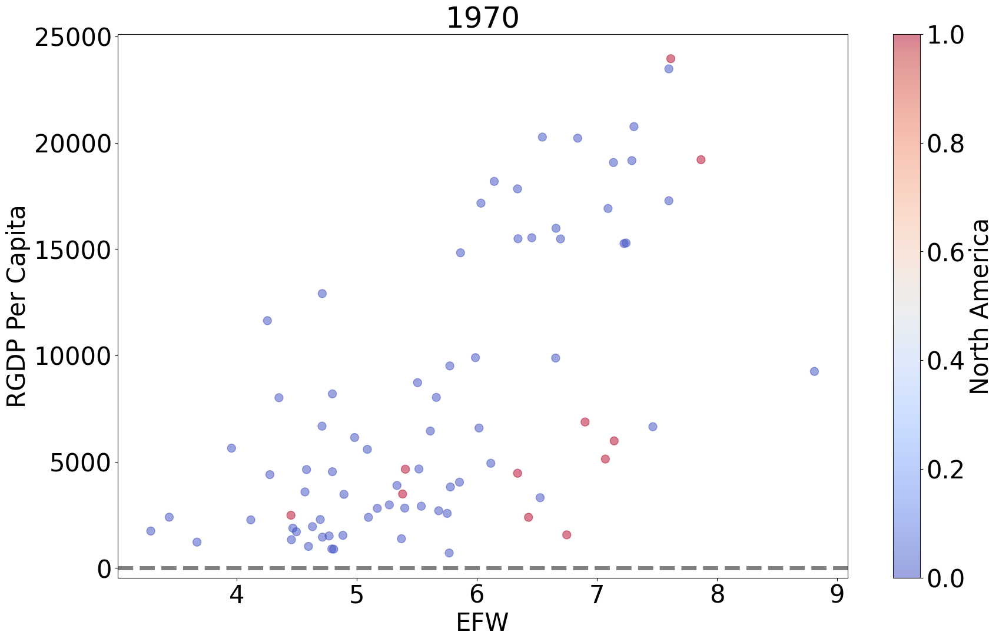

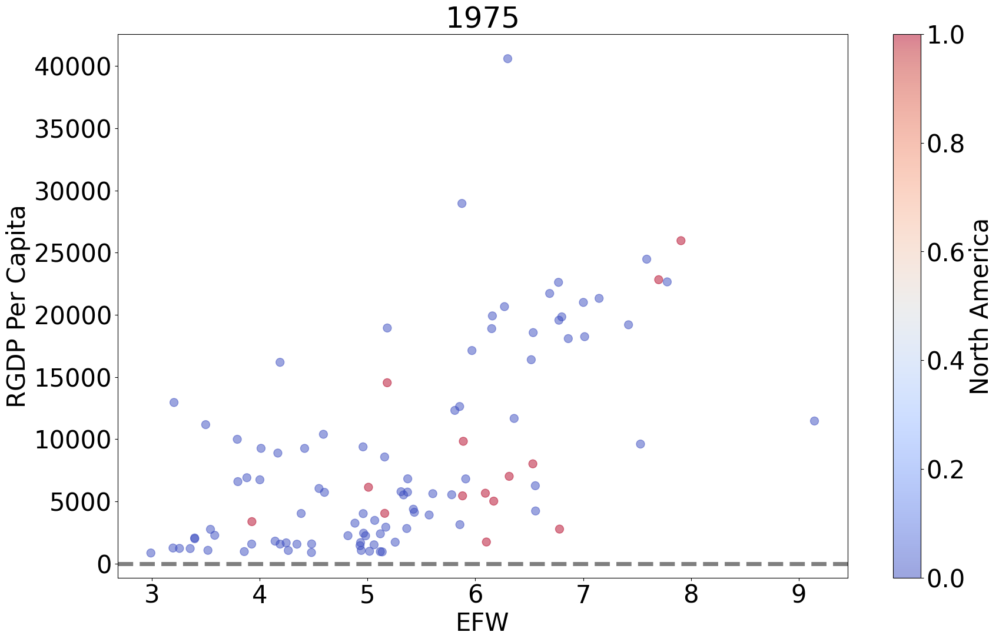

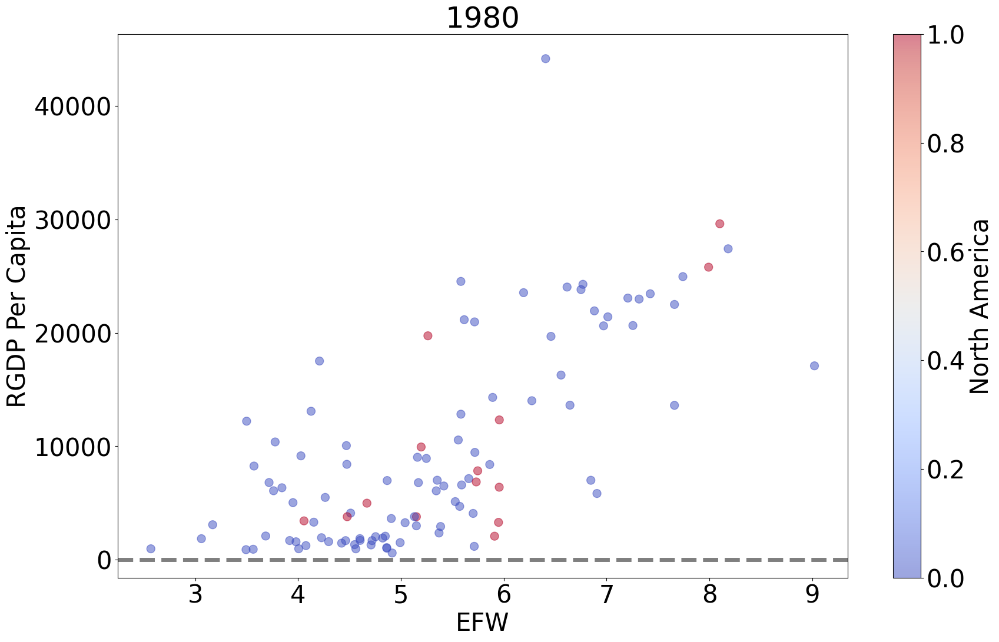

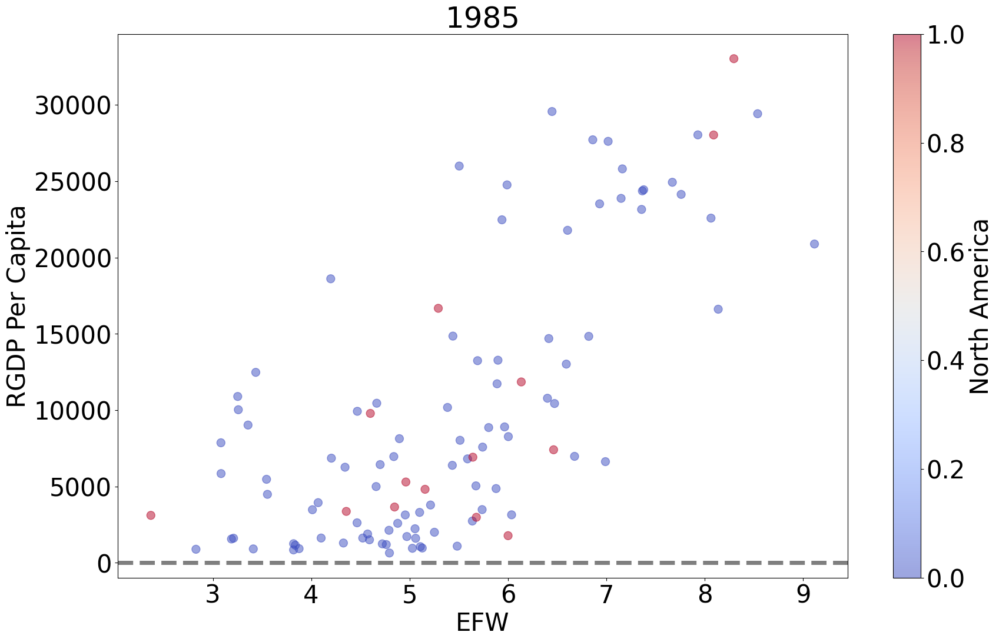

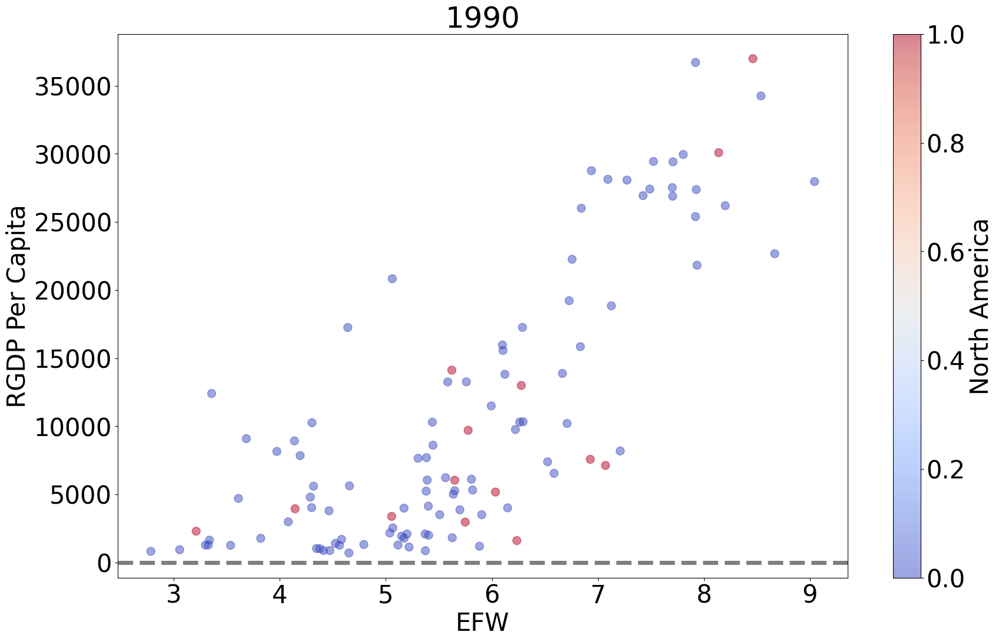

...

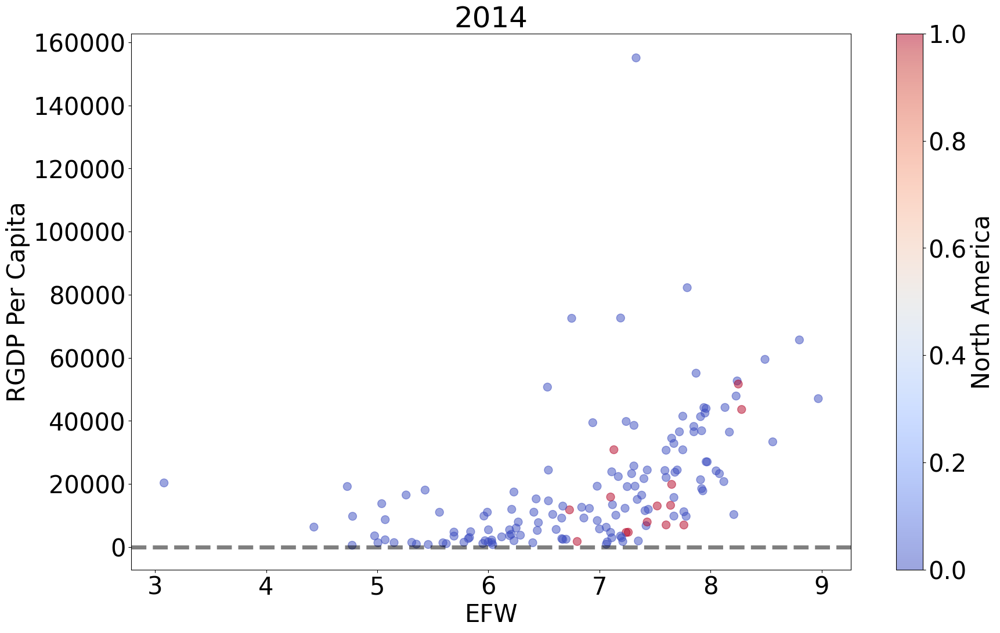

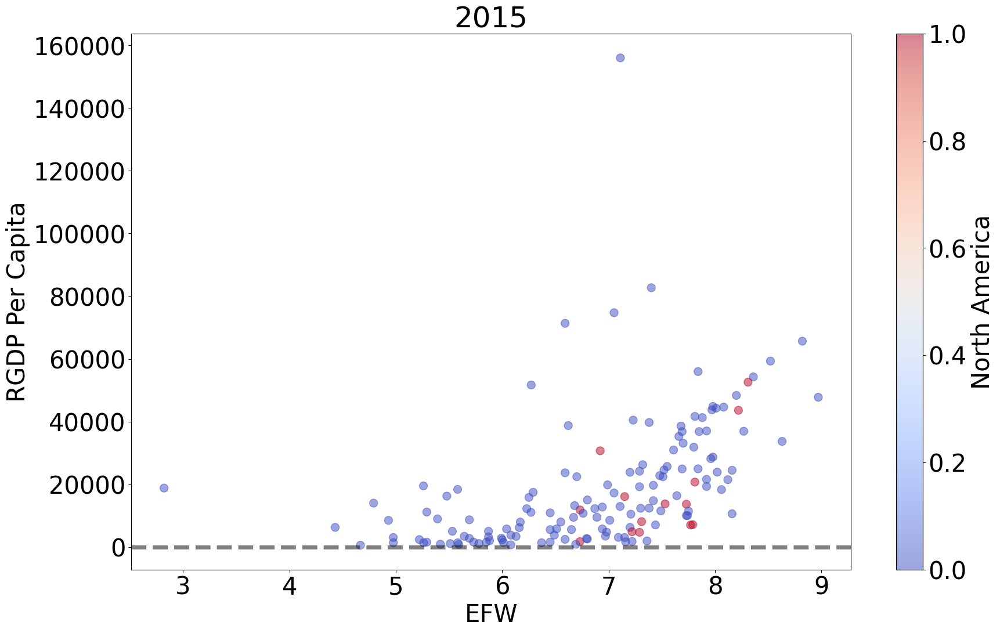

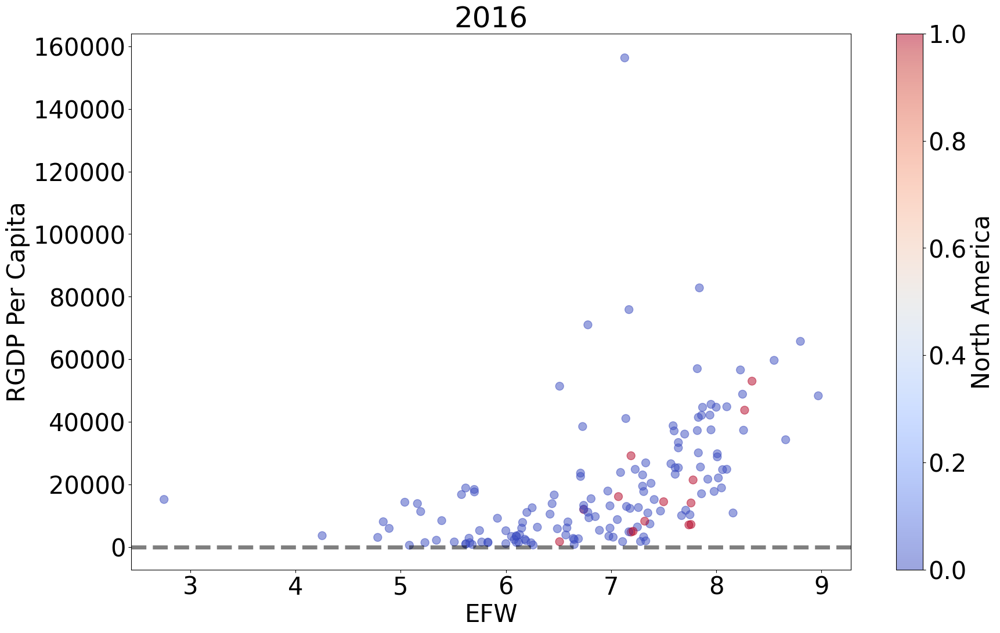

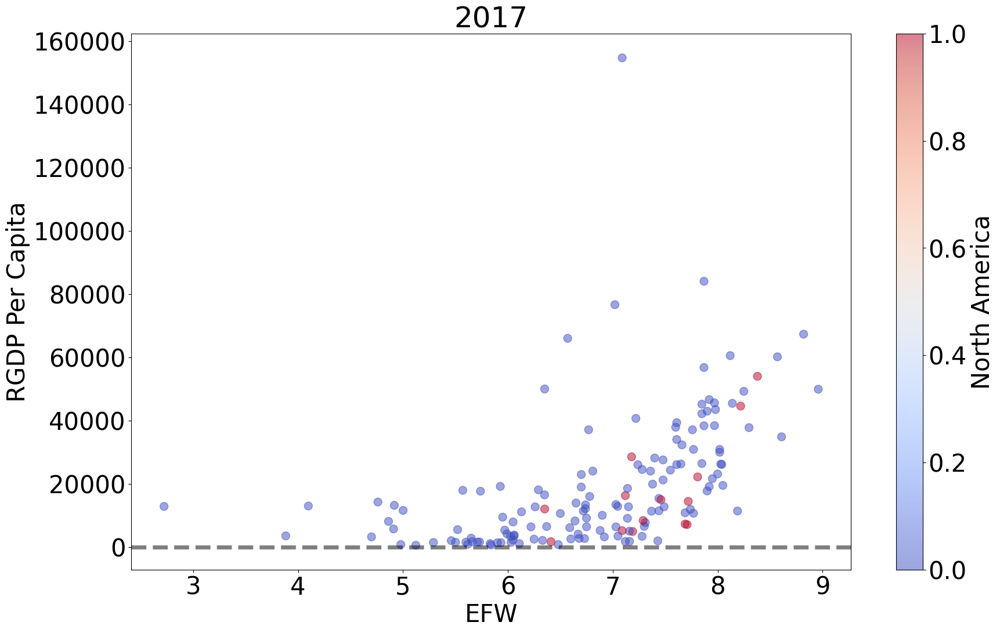

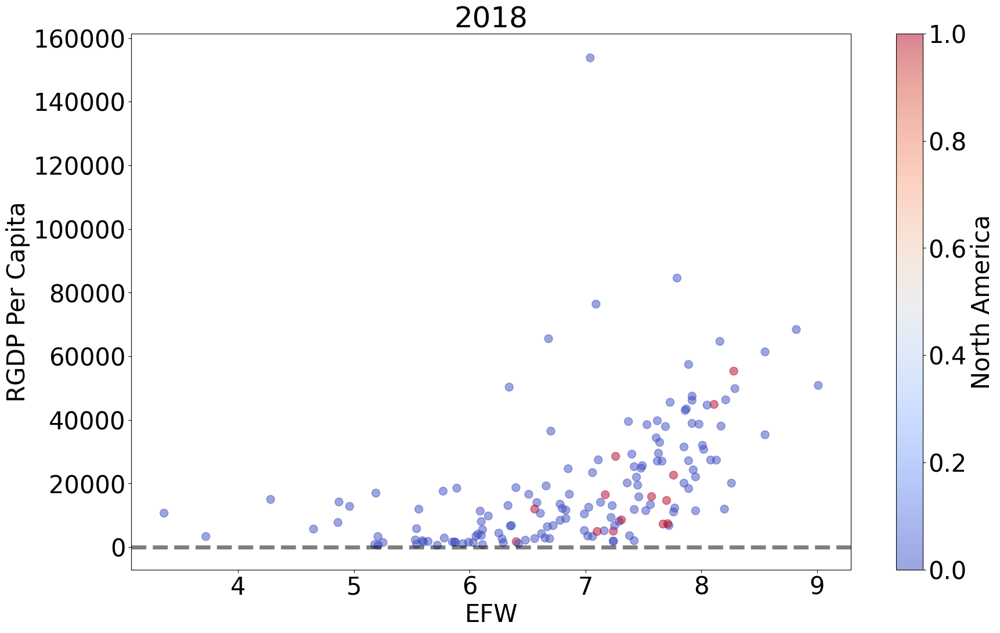

In [7]:
plt.rcParams.update({"font.size":30})
years = data.dropna(subset = ["RGDP Per Capita"]).index.get_level_values("Year").unique()
for year in years:
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (20,12))
    plot_data.plot.scatter(x = "EFW", y = "RGDP Per Capita", c = "North America", cmap = "coolwarm",
                          s = 100, ax = ax, alpha = .5)
    ax.set_title(str(year)[:4])
    ax.axhline(0,ls='--', color = 'k', alpha = .5, linewidth=5)
    
#plotly express can allow you to see one chart and see the data over time

In [8]:
n = 5
quantile_var = "RGDP Per Capita"
quantile_name = quantile_var + " " + str(n) + "-tile"

# Pass series to the df
data[quantile_name] = np.nan
data

ISO_Code_2   World Bank Region  \
ISO_Code_3 Year                                        
AGO        1970-01-01         AO  Sub-Saharan Africa   
           1975-01-01         AO  Sub-Saharan Africa   
           1980-01-01         AO  Sub-Saharan Africa   
           1985-01-01         AO  Sub-Saharan Africa   
           1990-01-01         AO  Sub-Saharan Africa   
...                          ...                 ...   
ZWE        2016-01-01         ZW  Sub-Saharan Africa   
           2017-01-01         ZW  Sub-Saharan Africa   
           2018-01-01         ZW  Sub-Saharan Africa   
           2019-01-01         ZW  Sub-Saharan Africa   
           2020-01-01         ZW  Sub-Saharan Africa   

                      World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)  \
ISO_Code_3 Year                                                                                                                                              
AGO        1970-01-01                                                NaN                                                                                     
           1975-01-01                                                NaN                                                                                     
           1980-01-01                                                NaN                                                                                     
           1985-01-01                                                NaN                                                                                     
           1990-01-01                                                 LM                                                                                     
...                                                                  ...                                                                                     
ZWE        2016-01-01                                                  L                                                                                     
           2017-01-01                                                  L                                                                                     
           2018-01-01                                                 LM                                                                                     
           2019-01-01                                                 LM                                                                                     
           2020-01-01                                                 LM                                                                                     

                      Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        1970-01-01    Angola       NaN                 NaN   
           1975-01-01    Angola       NaN                 NaN   
           1980-01-01    Angola       NaN                 NaN   
           1985-01-01    Angola       NaN                 NaN   
           1990-01-01    Angola       NaN                 NaN   
...                         ...       ...                 ...   
ZWE        2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   
           2019-01-01  Zimbabwe  4.719465            5.628359   
           2020-01-01  Zimbabwe  4.480000            5.562008   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        1970-01-01                               NaN          NaN   
           1975-01-01                               NaN          NaN   
           1980-01-01                               NaN          NaN   
           1985-01-01           

In [9]:
def create_quantile(n,data,year,quantile_var,quantile_name):
    # index which identifies countries for each year
    year_index = data.index.get_level_values("Year") == year
    quantile_values_dict = {
        i:data[year_index][quantile_var].quantile(i/n) for i in range(1, n+1)} 
    # generator function. 
    for index in data[year_index].index:
        val = data.loc[index][quantile_var]
        for i in range(1,n+1):
            if val <= quantile_values_dict[i]:
                data.loc[index,quantile_name] = int((n+1) - i)
                break
        else:
            continue
            
for year in years:
    create_quantile(n, data, year, quantile_var, quantile_name)

data.loc["USA"].dropna()

,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America,RGDP Per Capita 5-tile
Year,,,,,,,,,,,,,,
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,1,1.0
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,1,1.0
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,1,1.0
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,1,1.0
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,1,1.0
2003-01-01,US,North America,H,United States,8.558717,7.866283,8.257379,9.743489,8.338465,8.662287,0.712756,47157.9953,1,1.0
2004-01-01,US,North America,H,United States,8.618290,8.071277,8.139297,9.753433,8.378804,8.786829,0.689687,48492.7171,1,1.0
2005-01-01,US,North America,H,United States,8.509323,7.892833,7.937832,9.704102,8.289870,8.736210,0.747288,49654.7614,1,1.0
2006-01-01,US,North America,H,United States,8.509323,7.871725,7.874278,9.650034,8.305433,8.861652,0.754435,50489.8600,1,1.0


<Axes: xlabel='EFW', ylabel='RGDP Per Capita'>

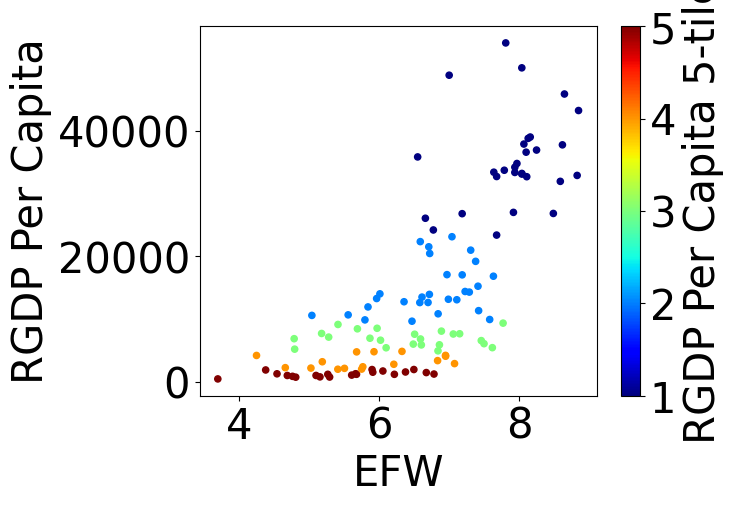

In [10]:
year = '2000'
plot_data = data[data.index.get_level_values("Year") == year]
plot_data.plot.scatter(x = 'EFW',
                      y = 'RGDP Per Capita',
                      c = 'RGDP Per Capita ' + str(n) + '-tile',
                      cmap = 'jet')

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3461141328.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm.get_cmap("jet",n)


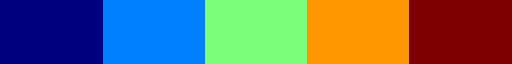

In [11]:
cm.get_cmap("jet",n)

### I tried for half an hour to get this to work, but it just will not. Seems the error was as simple as reinstalling plotly and matplotlib. What a drag

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3170957628.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet',n)
C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3170957628.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (24,16))


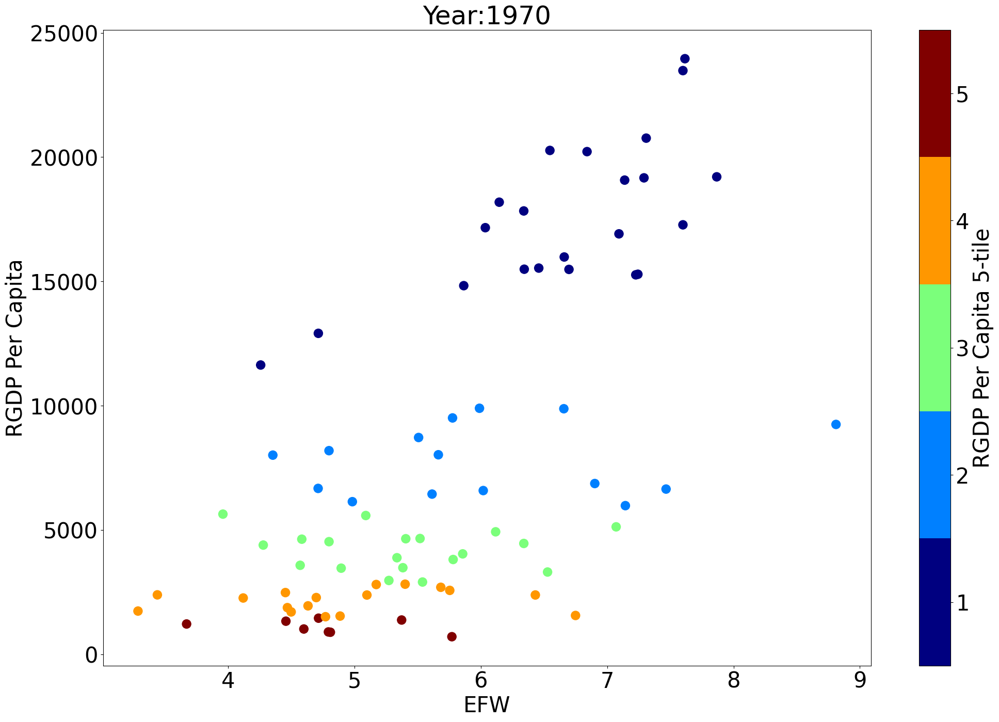

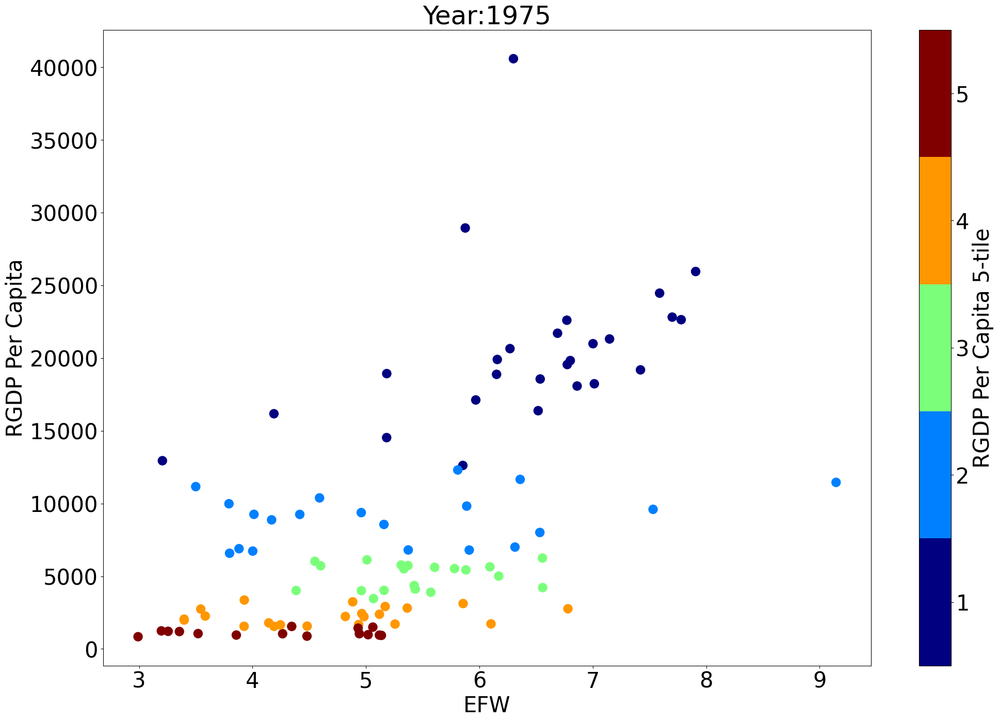

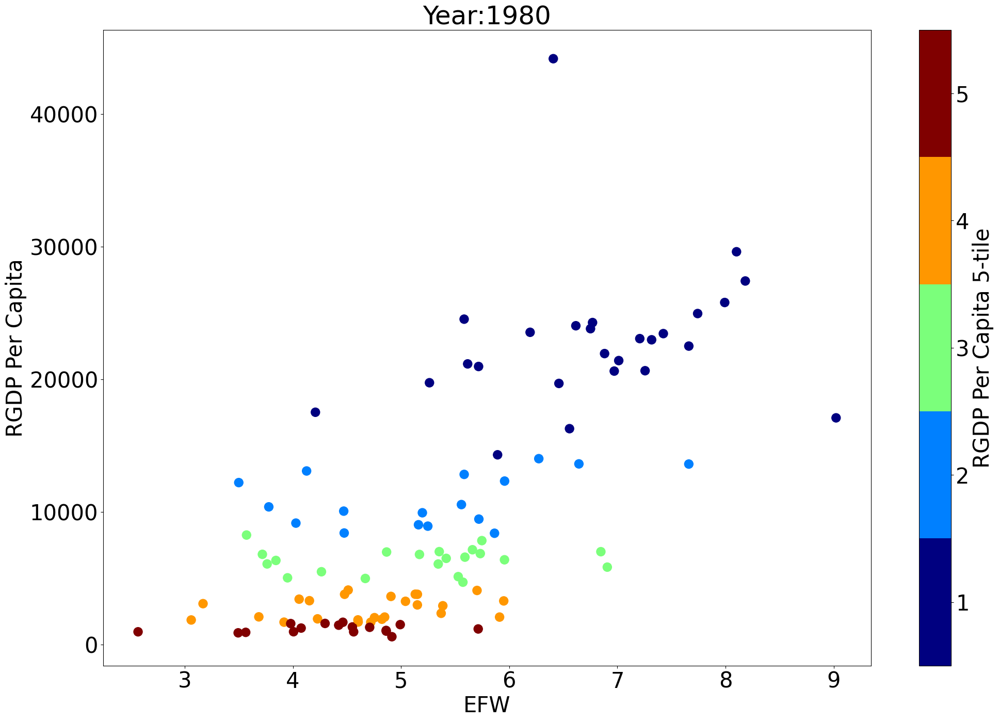

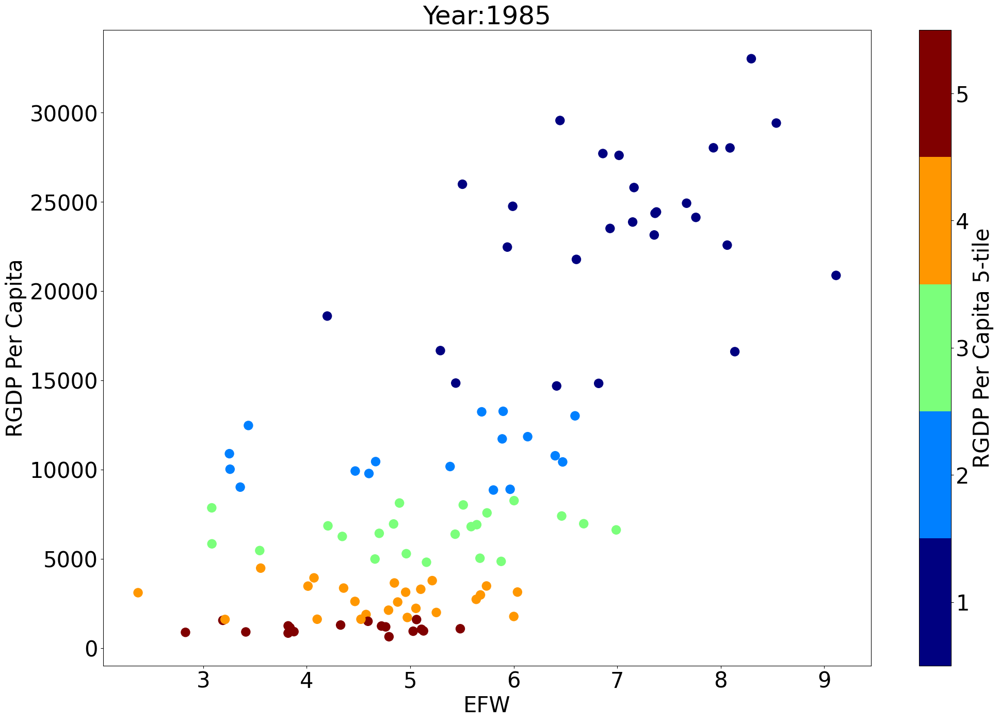

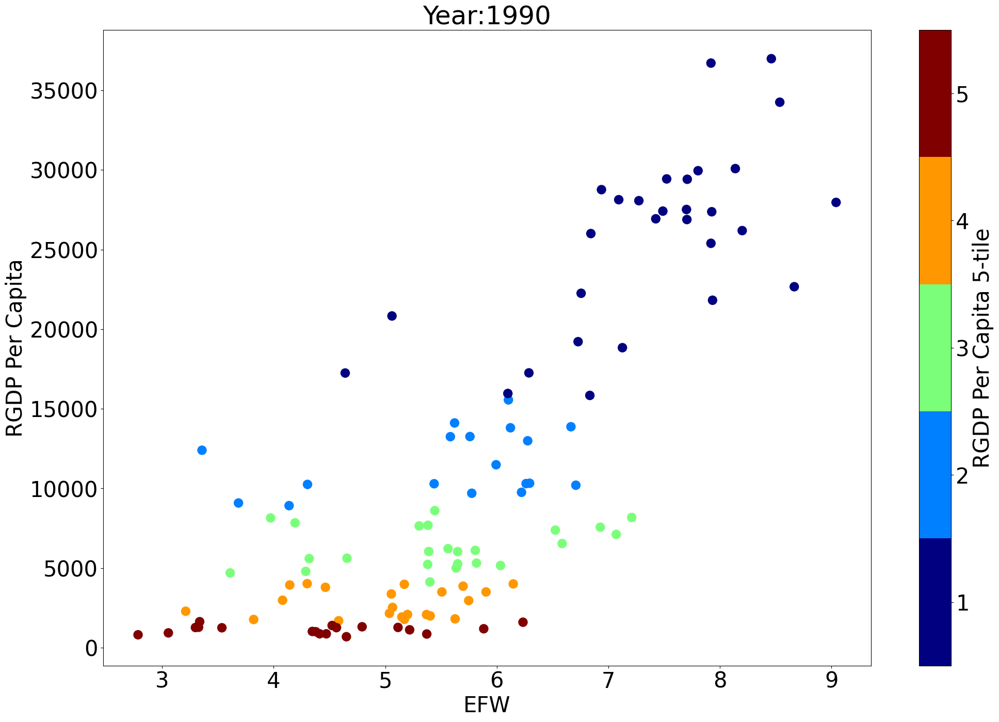

...

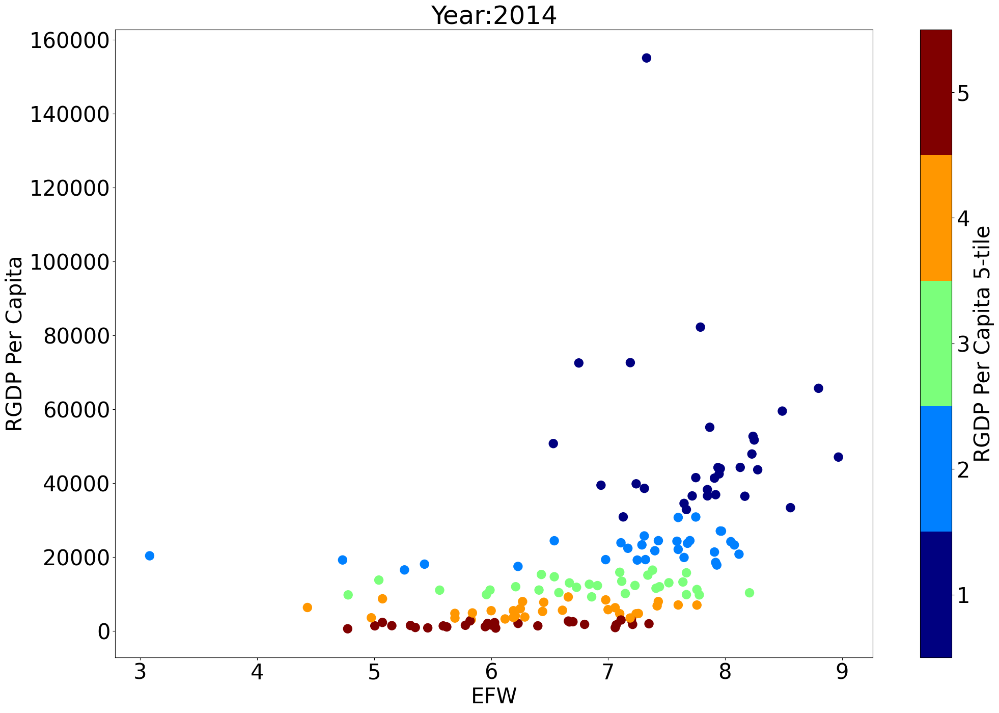

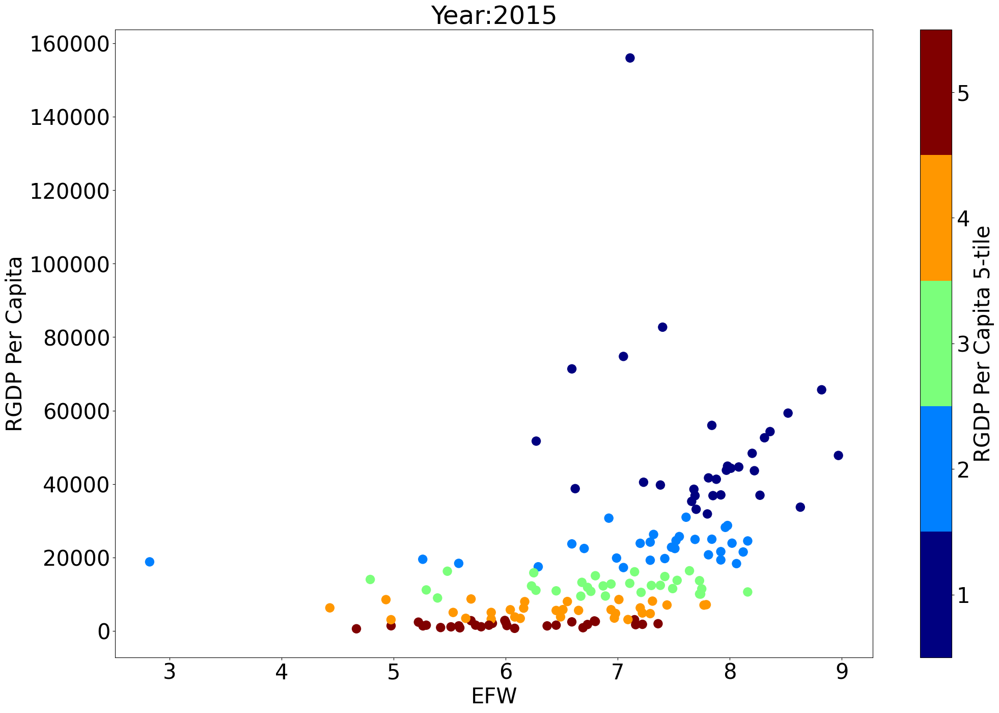

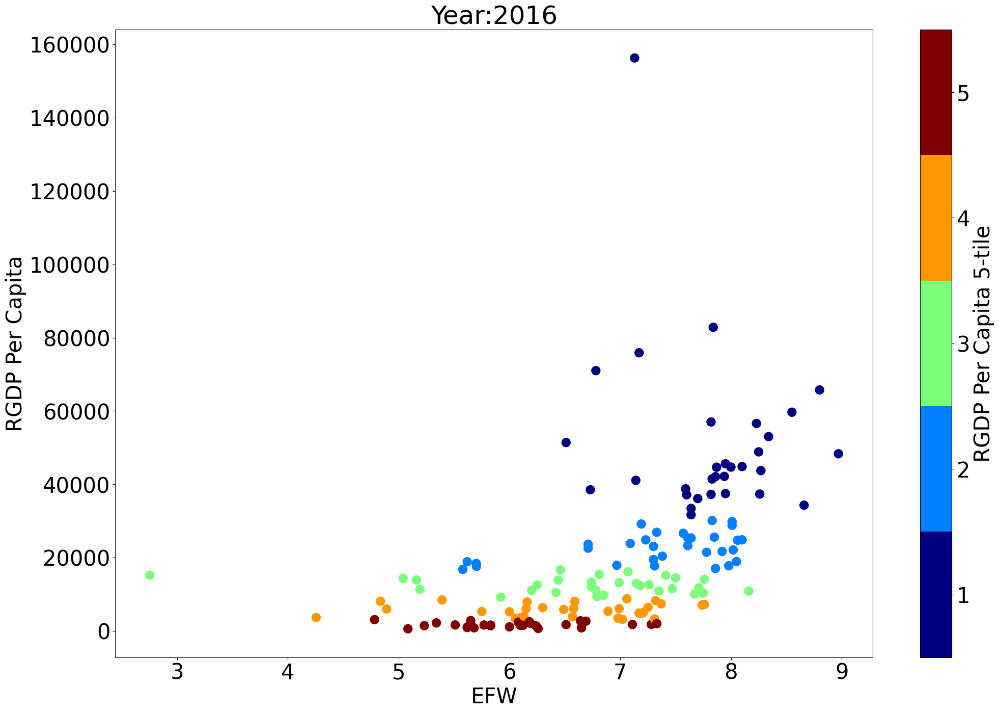

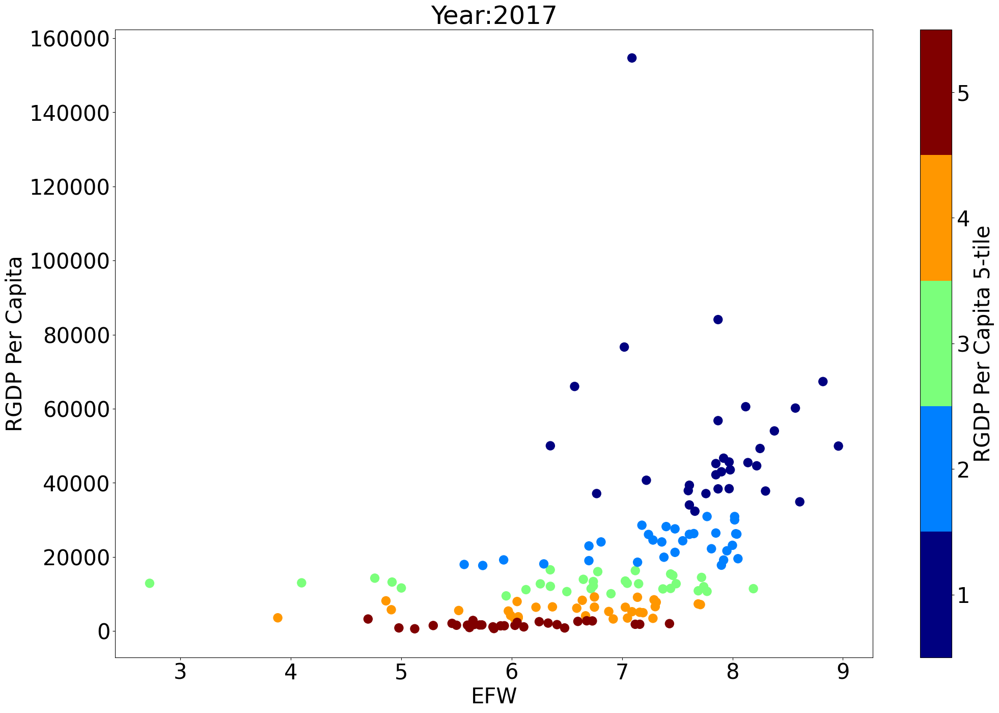

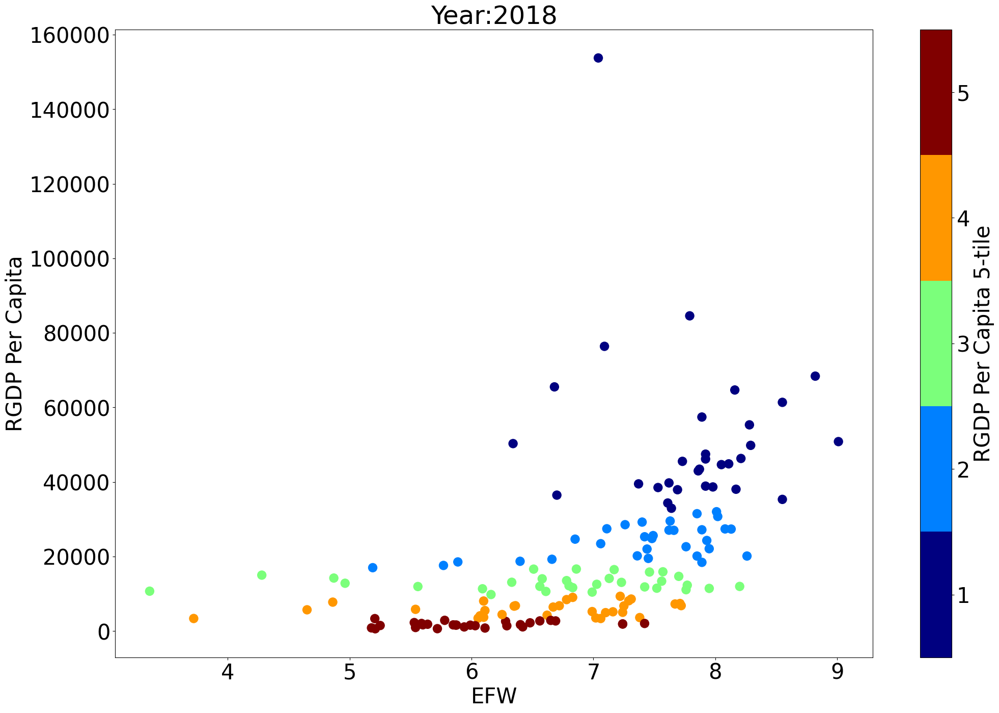

In [12]:
cmap = cm.get_cmap('jet',n)
for year in years:
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (24,16))

    plot_data.plot.scatter(x = "EFW", 
                           y = "RGDP Per Capita",
                           c = "RGDP Per Capita " + str(n) + "-tile", 
                          cmap = cmap,
                          ax=ax,
                          s=150,
                          vmin = .5,
                          vmax = 5.5)
    ax.set_title("Year:" + str(year)[:4])

In [13]:
import plotly.express as px

# assign px.data.gapminder() to df. 
df = px.data.gapminder()

# From px.data.gapminder plotly the following:
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

In [21]:
import statsmodels.api as sm

X_names = ['EFW']
Y_NAME = ['RGDP Per Capita']

def regress(data, X_names, Y_NAME):
    X= reg_data[X_names]
    y = reg_data[Y_NAME]
    results = sm.OLS(y,X).fit()
    results.summary()
    return results

In [22]:
regress(reg_data, X_names, Y_NAME)

In [23]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.558
Model:                            OLS   Adj. R-squared (uncentered):              0.557
Method:                 Least Squares   F-statistic:                              3537.
Date:                Fri, 28 Apr 2023   Prob (F-statistic):                        0.00
Time:                        20:21:38   Log-Likelihood:                         -31229.
No. Observations:                2808   AIC:                                  6.246e+04
Df Residuals:                    2807   BIC:                                  6.247e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
EFW         2688.6007     45.206     59.474      0.000    2599.960    2777.241
==============================================================================
Omnibus:                     1814.539   Durbin-Watson:                   0.126
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31007.890
Skew:                           2.800   Prob(JB):                         0.00
Kurtosis:                      18.286   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\1832139127.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\1832139127.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



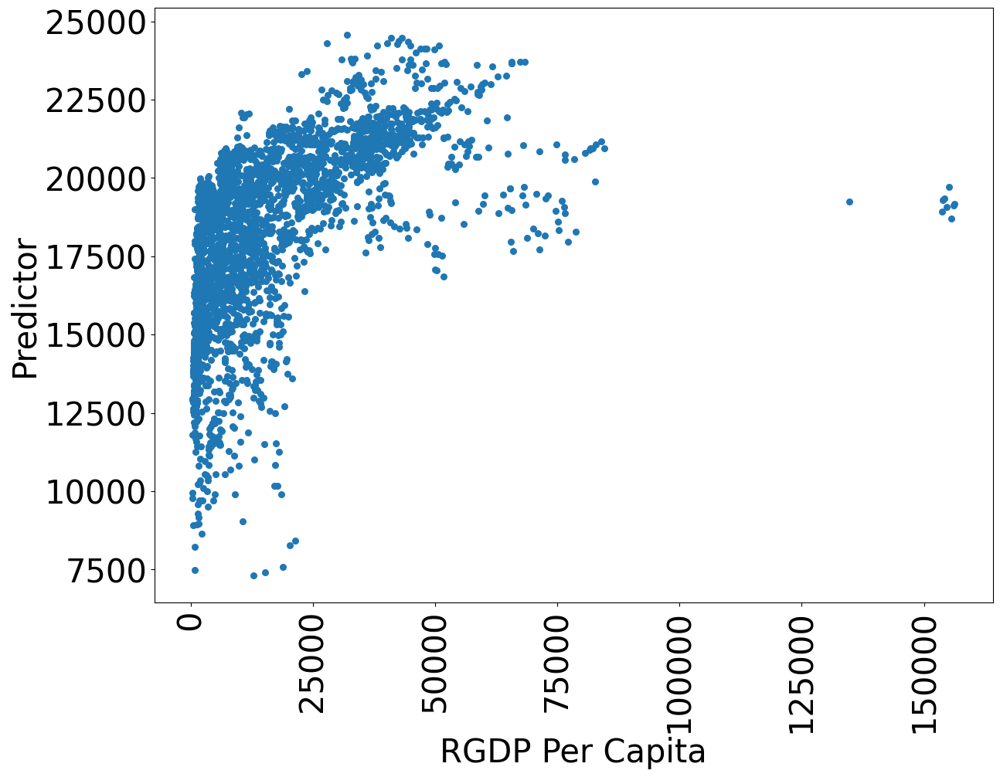

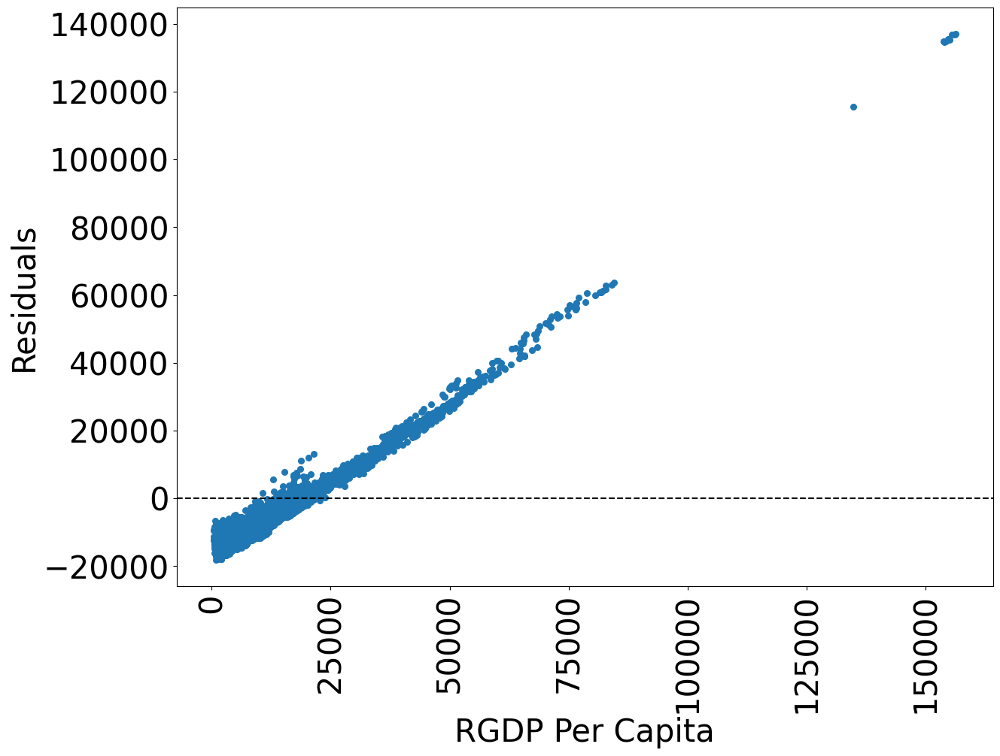

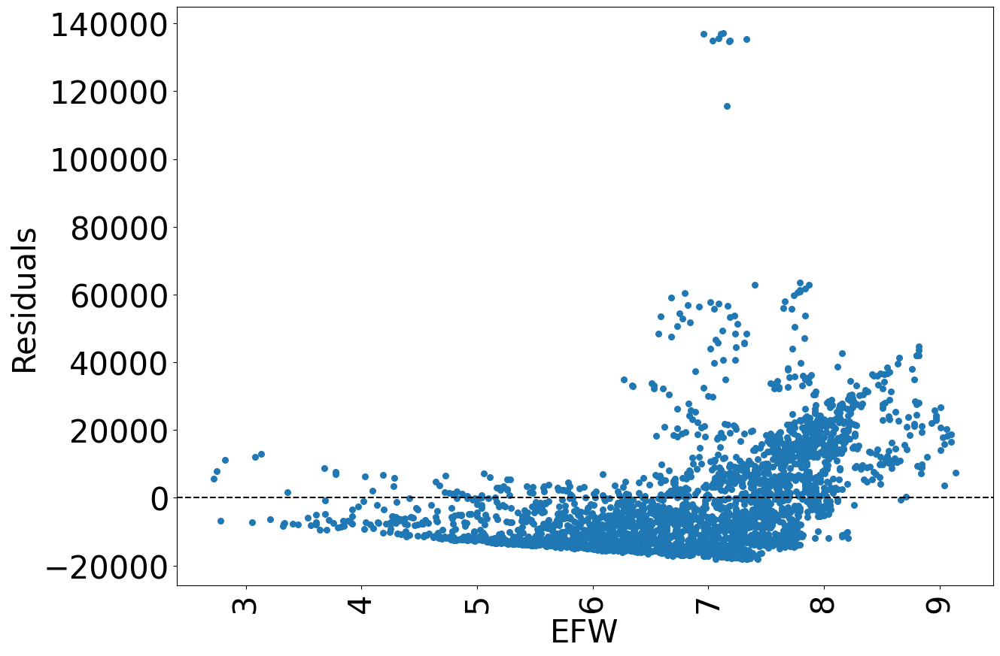

In [15]:
def plot_residuals(r_df, y_var, x_vars):

    fig, ax = plt.subplots(figsize = (14,10))

    r_df.plot.scatter(x = y_var[0],
                     y = "Predictor", 
                      s = 30, ax = ax)
    plt.xticks(rotation=90)
    plt.show()
    plt.close()

    for var in y_var + x_vars:
        fig, ax = plt.subplots(figsize = (14,10))
        r_df.plot.scatter(x = var,
                         y = "Residuals", 
                          s = 30, ax = ax)
        ax.axhline(0, ls = "--", color = "k")
        plt.xticks(rotation=90)
        plt.show()
        plt.close()
        
        
reg_data["Predictor"] = results.predict()
reg_data["Residuals"] = results.resid
plot_residuals(reg_data, Y_NAME,X_names)

In [25]:
X_names = ['RGDP Per Capita 5-tile']
results = regress(reg_data, X_names, Y_NAME)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.134
Model:                            OLS   Adj. R-squared (uncentered):              0.133
Method:                 Least Squares   F-statistic:                              433.4
Date:                Fri, 28 Apr 2023   Prob (F-statistic):                    1.27e-89
Time:                        20:22:18   Log-Likelihood:                         -32172.
No. Observations:                2808   AIC:                                  6.435e+04
Df Residuals:                    2807   BIC:                                  6.435e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
RGDP Per Capita 5-tile  2794.5764    134.243     20.817      0.000    2531.352    3057.801
==============================================================================
Omnibus:                     1053.057   Durbin-Watson:                   0.103
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5528.543
Skew:                           1.709   Prob(JB):                         0.00
Kurtosis:                       8.964   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [27]:
X_names = ['RGDP Per Capita 5-tile']
results = regress(reg_data[Y_NAME + X_names].groupby("ISO_Code_3").diff(), X_names, Y_NAME)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.134
Model:                            OLS   Adj. R-squared (uncentered):              0.133
Method:                 Least Squares   F-statistic:                              433.4
Date:                Fri, 28 Apr 2023   Prob (F-statistic):                    1.27e-89
Time:                        20:23:21   Log-Likelihood:                         -32172.
No. Observations:                2808   AIC:                                  6.435e+04
Df Residuals:                    2807   BIC:                                  6.435e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
RGDP Per Capita 5-tile  2794.5764    134.243     20.817      0.000    2531.352    3057.801
==============================================================================
Omnibus:                     1053.057   Durbin-Watson:                   0.103
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5528.543
Skew:                           1.709   Prob(JB):                         0.00
Kurtosis:                       8.964   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

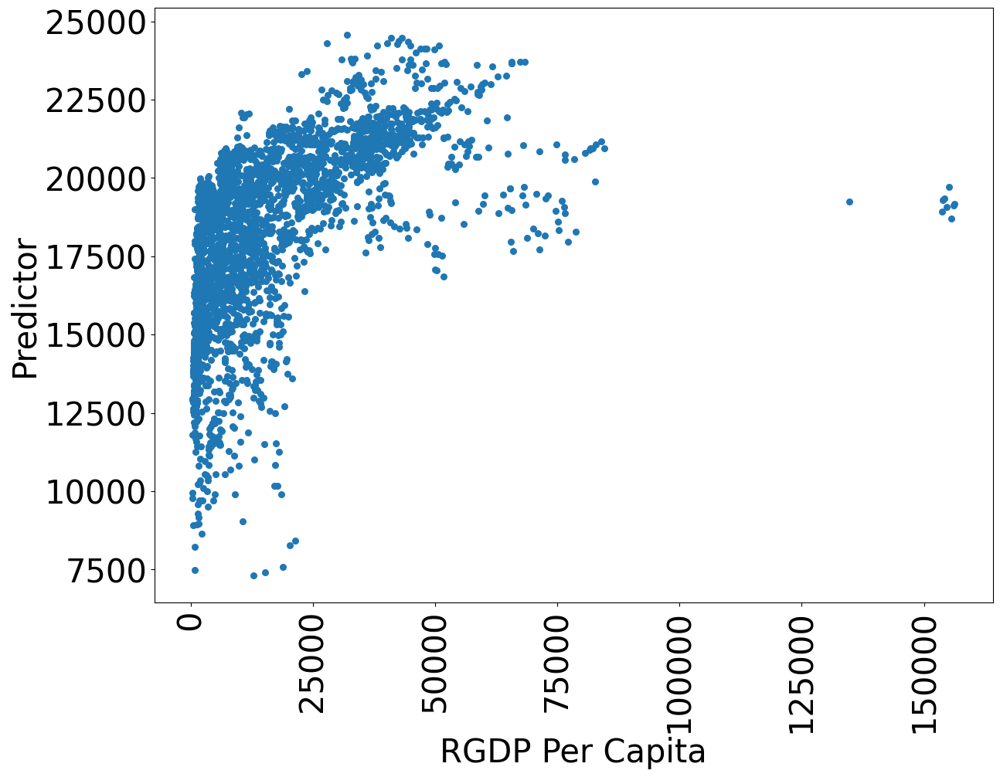

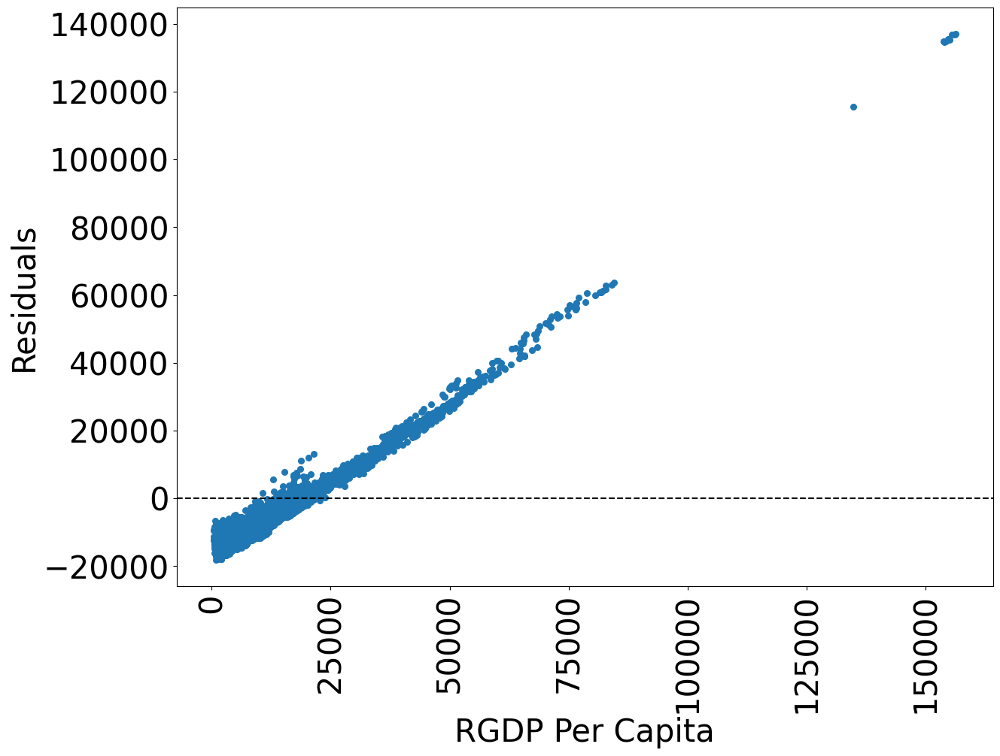

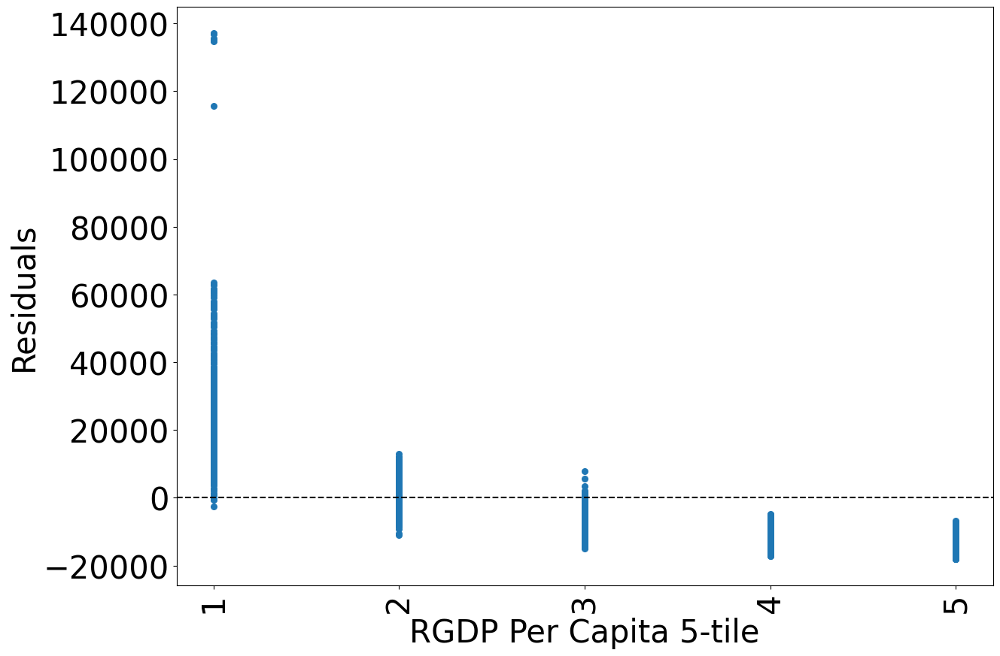

In [28]:
plot_residuals(reg_data, Y_NAME, X_names)

# Panel Regression

In [32]:
from linearmodels import PanelOLS

def panel_regress(data, x_names, y_name, constant = False, entity = False, time = False):
    X = data[x_names]
    if constant:
        X['constant'] = 1
    y = data[y_name]
    results = PanelOLS(y, X, entity_effects = entity, time_effects = time).fit(cov_type='clustered', cluster_entity=True)
    return results
reg_data = data.dropna()



In [34]:
results = panel_regress(reg_data, X_names, Y_NAME, constant = True, entity = True, time = True)
results

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3413810303.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Dep. Variable:,RGDP Per Capita,R-squared:,0.0716
Estimator:,PanelOLS,R-squared (Between):,0.3181
No. Observations:,2808,R-squared (Within):,0.0292
Date:,"Fri, Apr 28 2023",R-squared (Overall):,0.3474
Time:,20:27:01,Log-likelihood,-2.64e+04
Cov. Estimator:,Clustered,,
,,F-statistic:,203.30
Entities:,165,P-value,0.0000
Avg Obs:,17.018,Distribution:,"F(1,2635)"
Min Obs:,0.0000,,
Max Obs:,21.000,F-statistic (robust):,26.780


C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3570006697.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3570006697.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



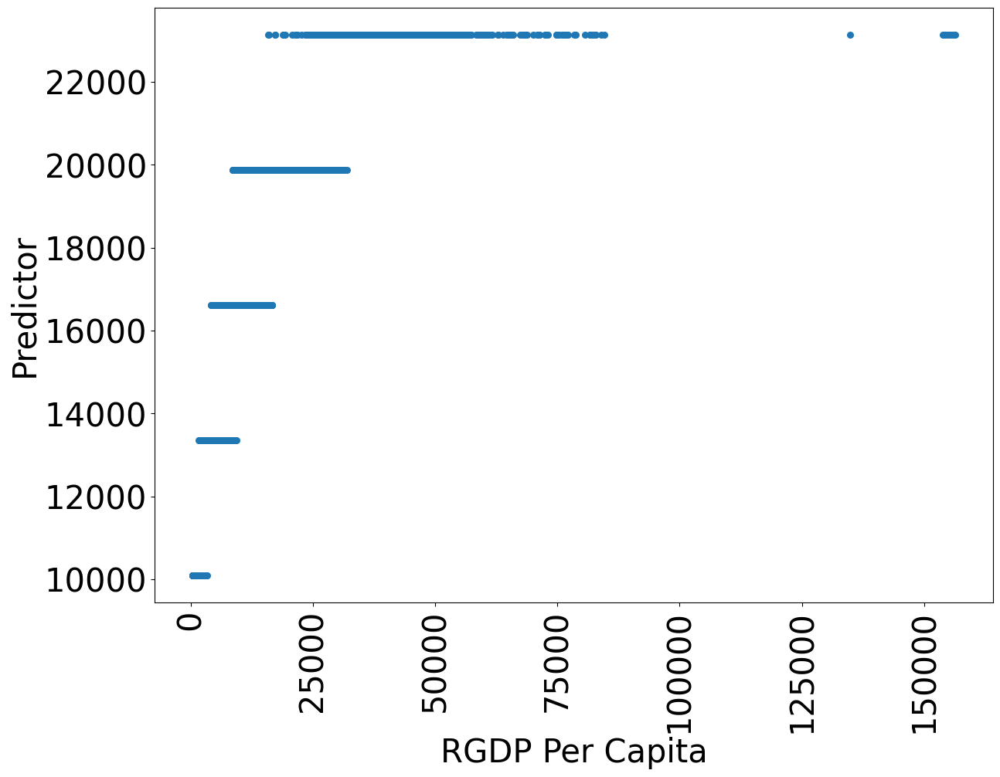

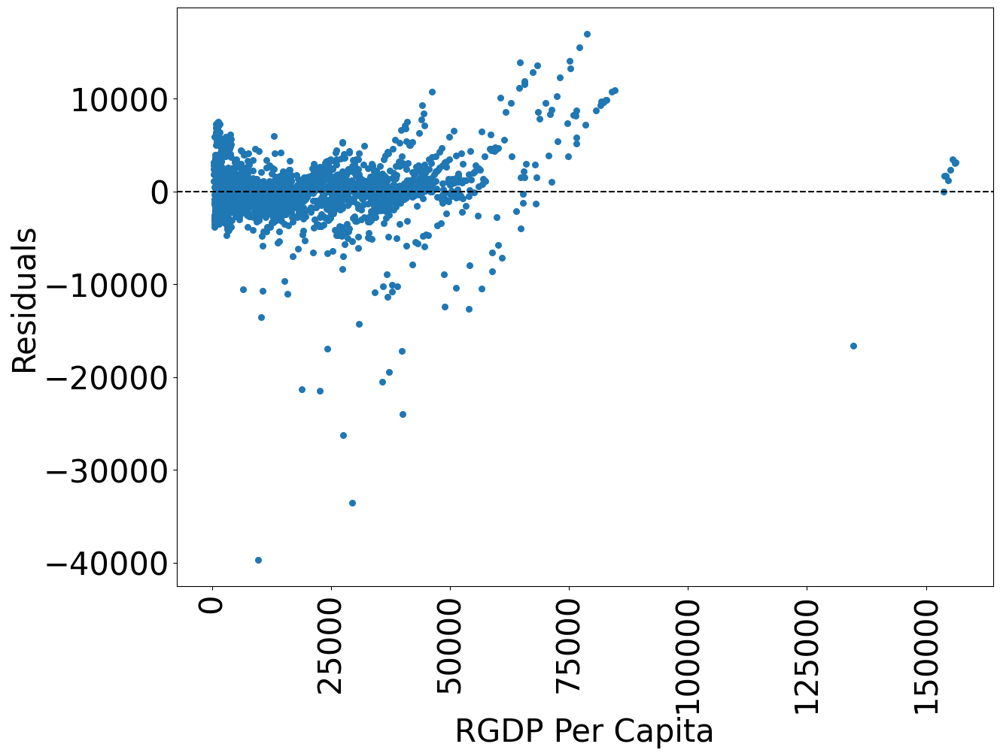

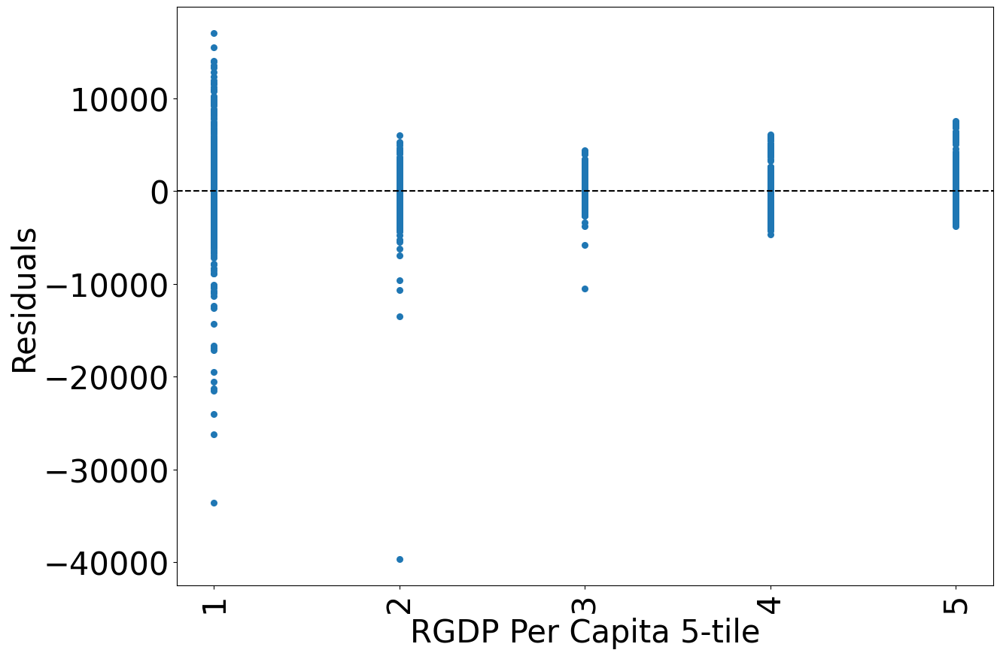

In [38]:
reg_data["Predictor"] = results.predict()
reg_data["Residuals"] = results.resids
plot_residuals(reg_data, Y_NAME, X_names)

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3413810303.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

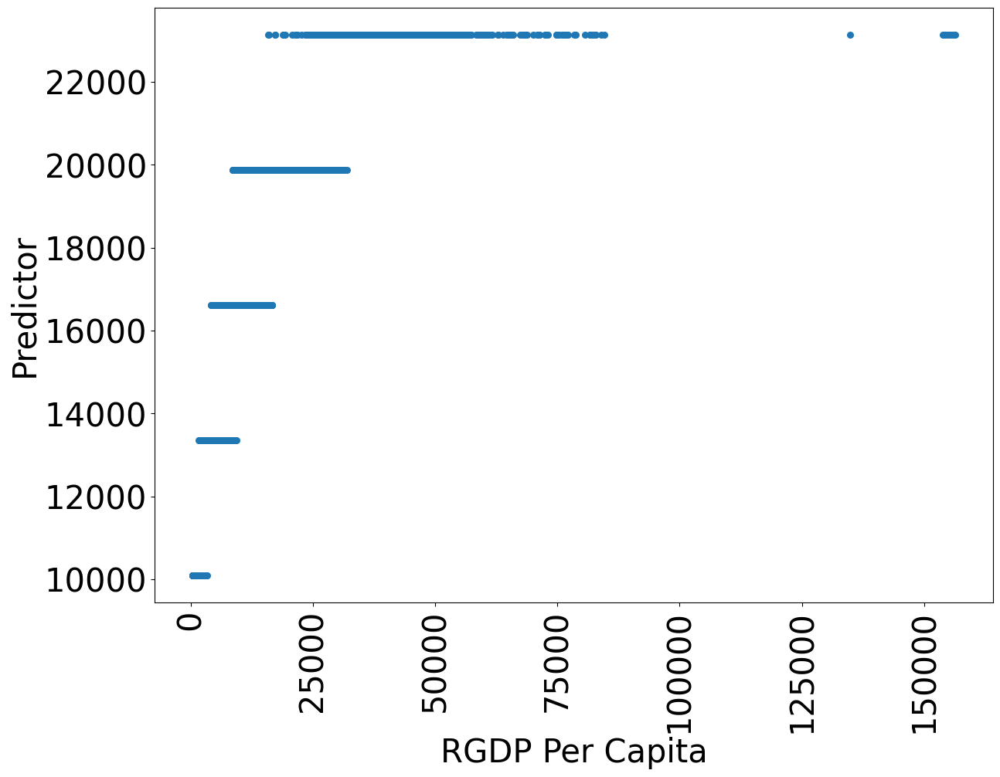

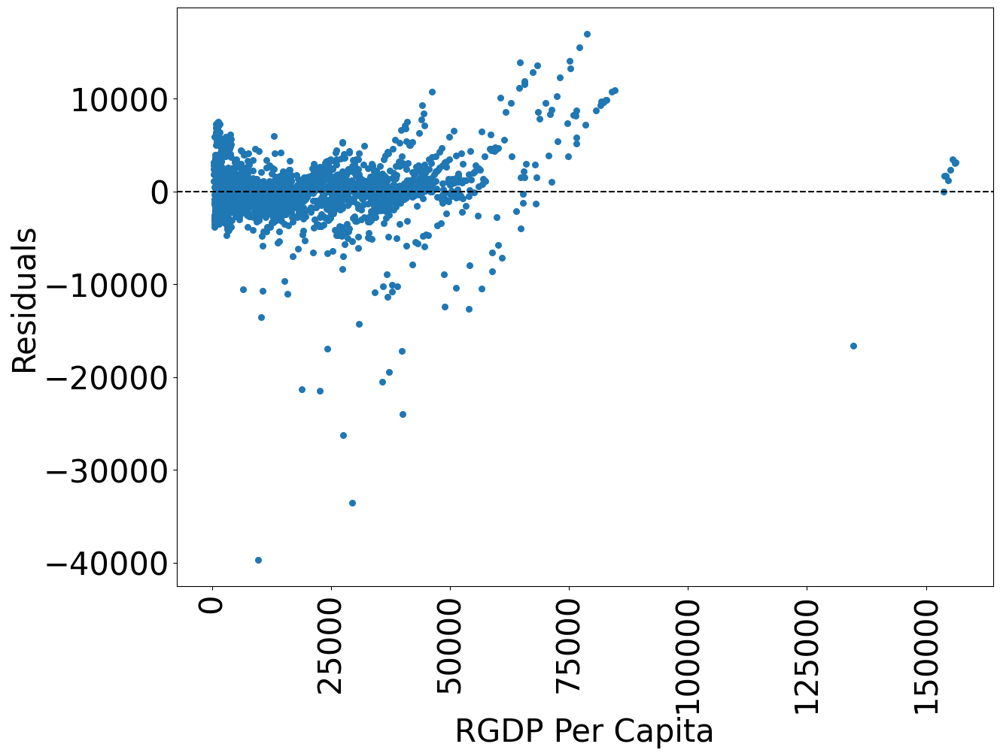

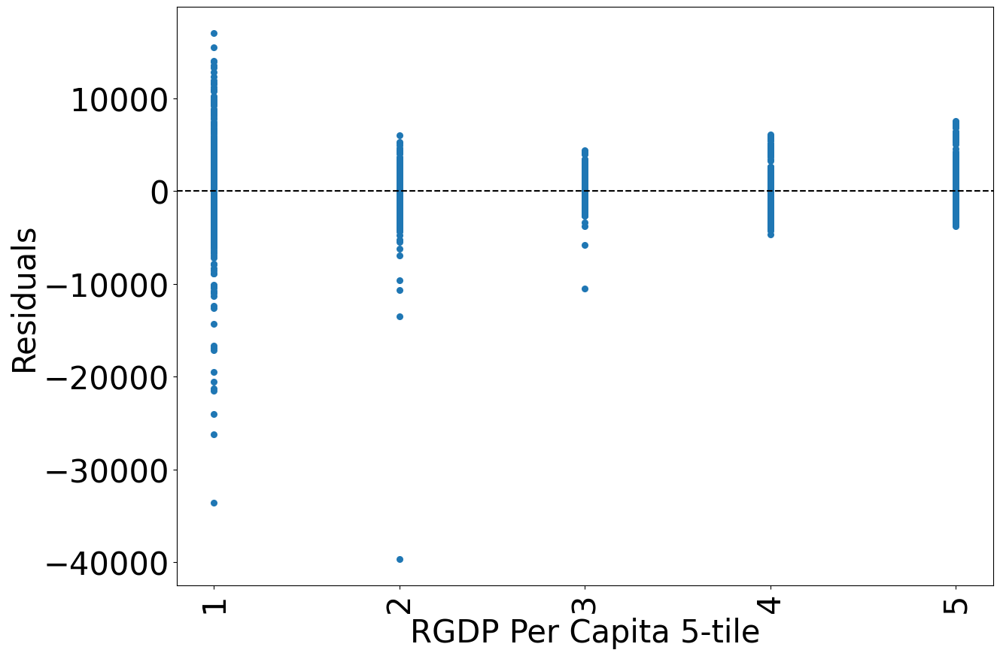

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3413810303.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

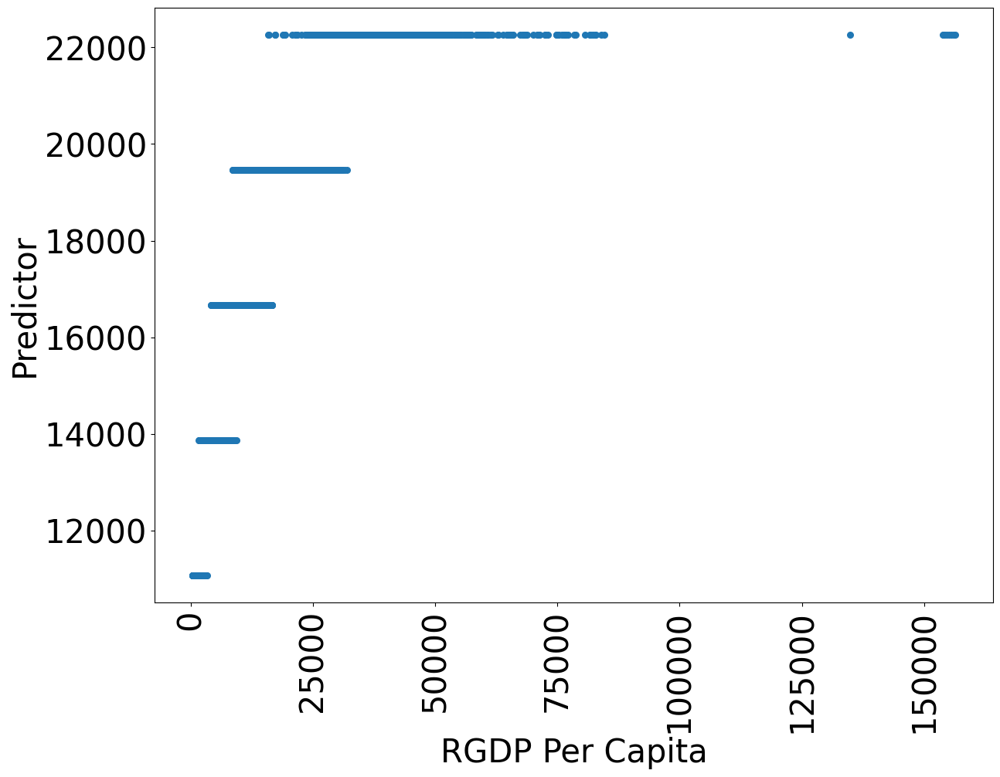

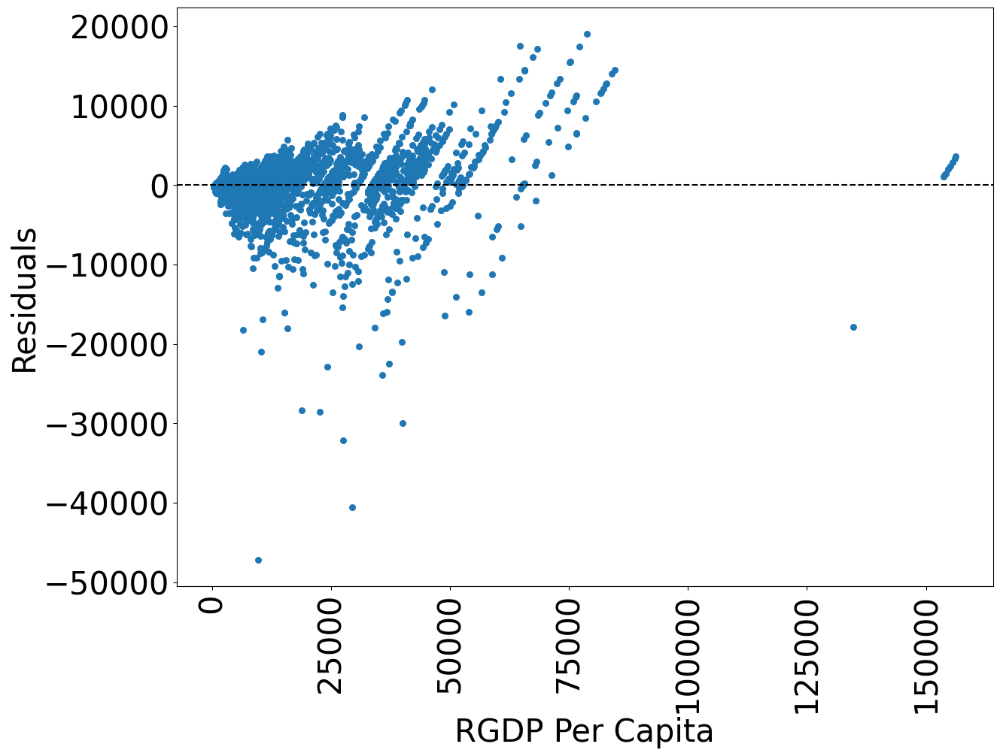

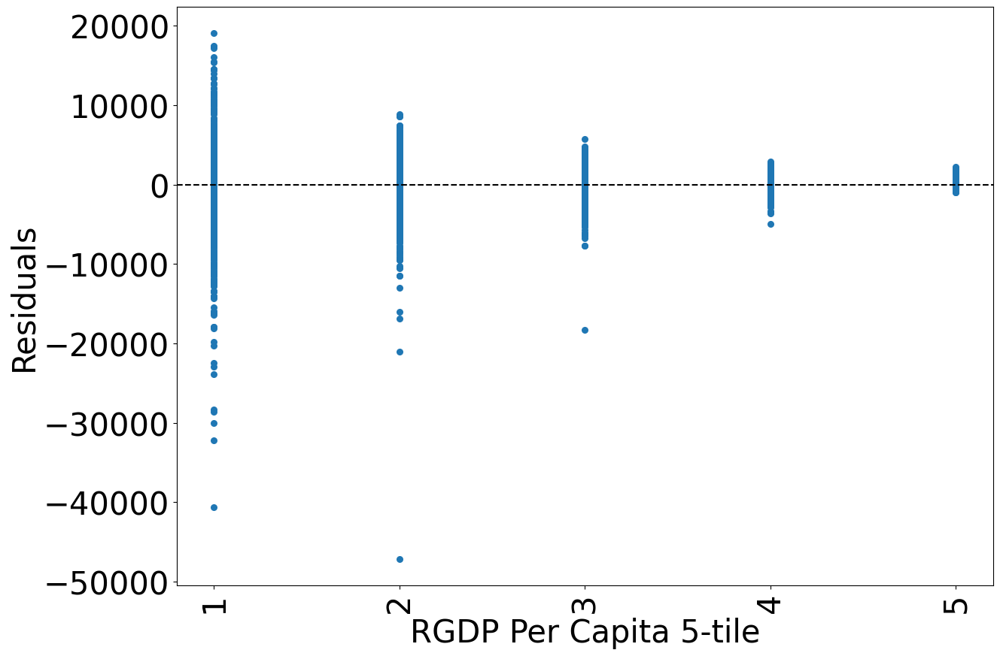

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3413810303.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

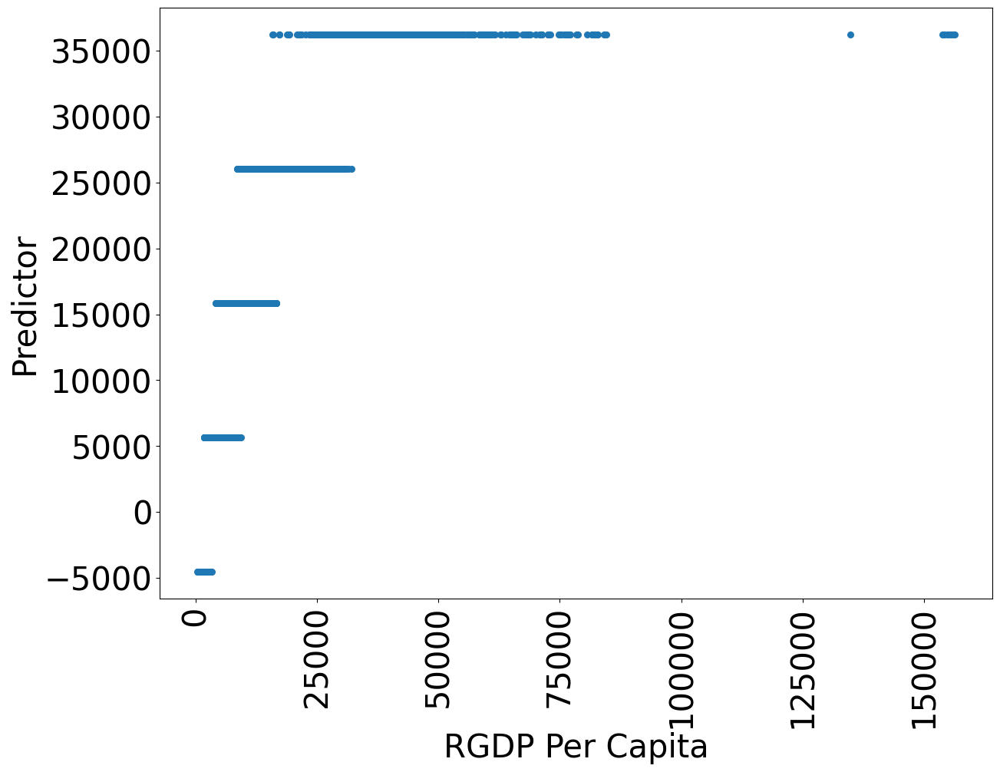

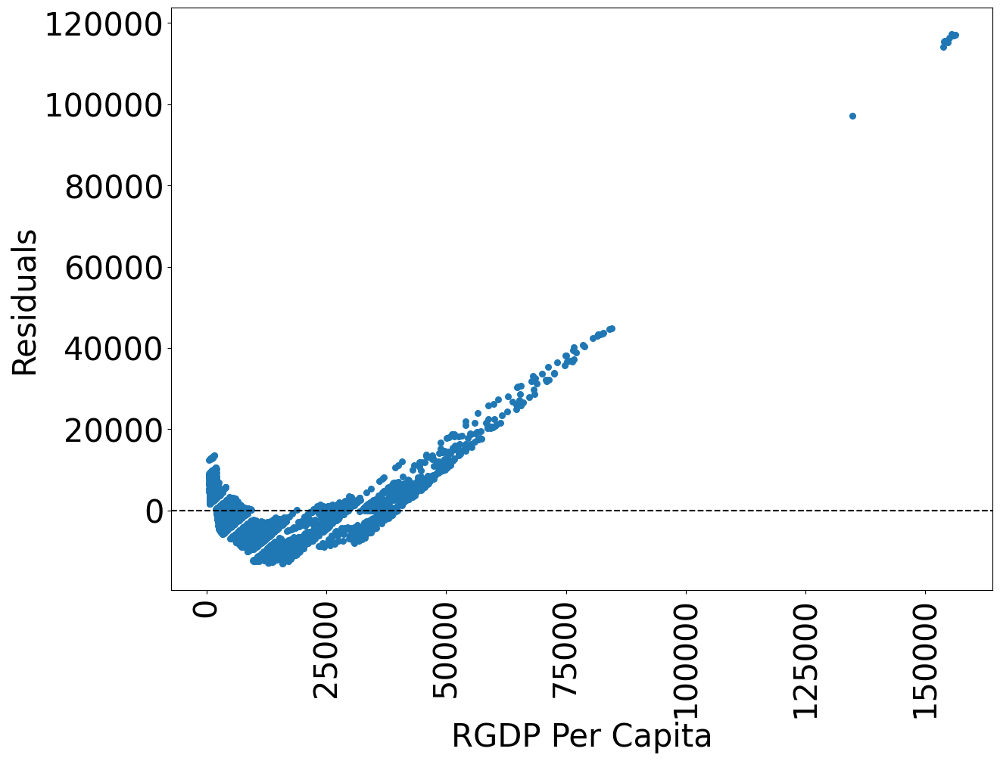

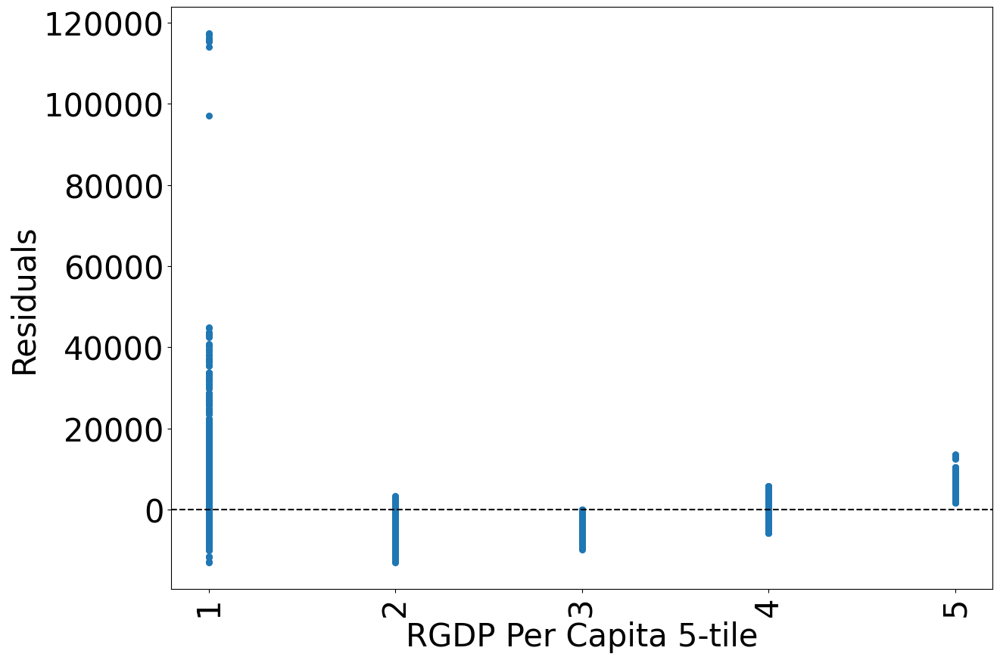

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3413810303.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\calvi\AppData\Local\Temp\ipykernel_19968\3090614948.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

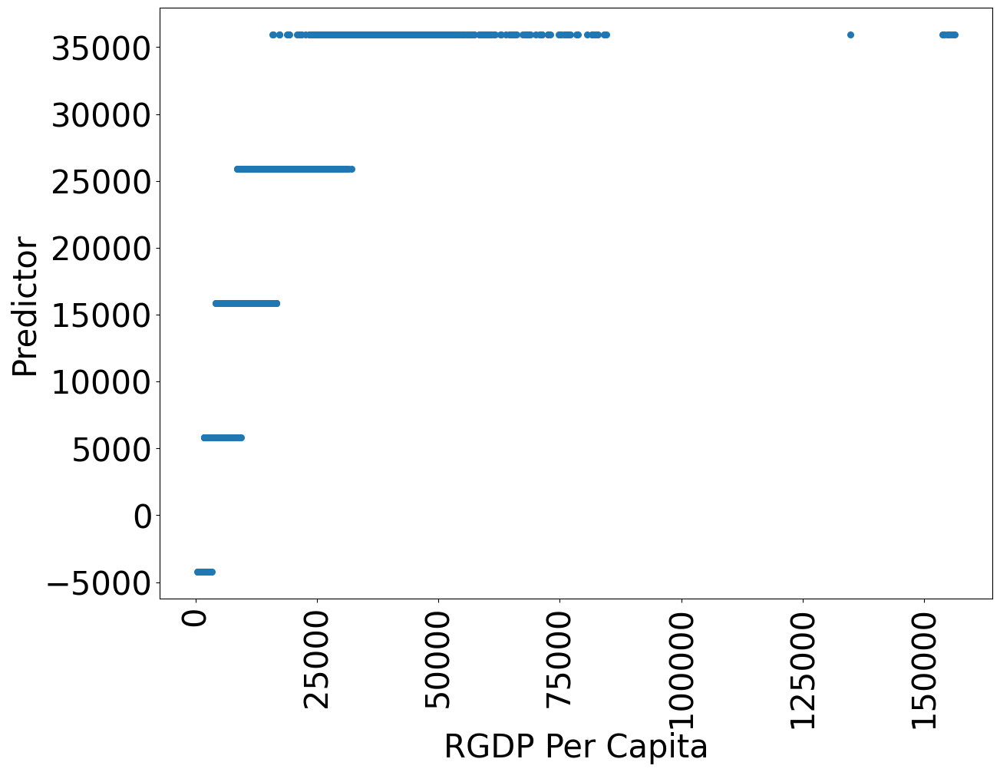

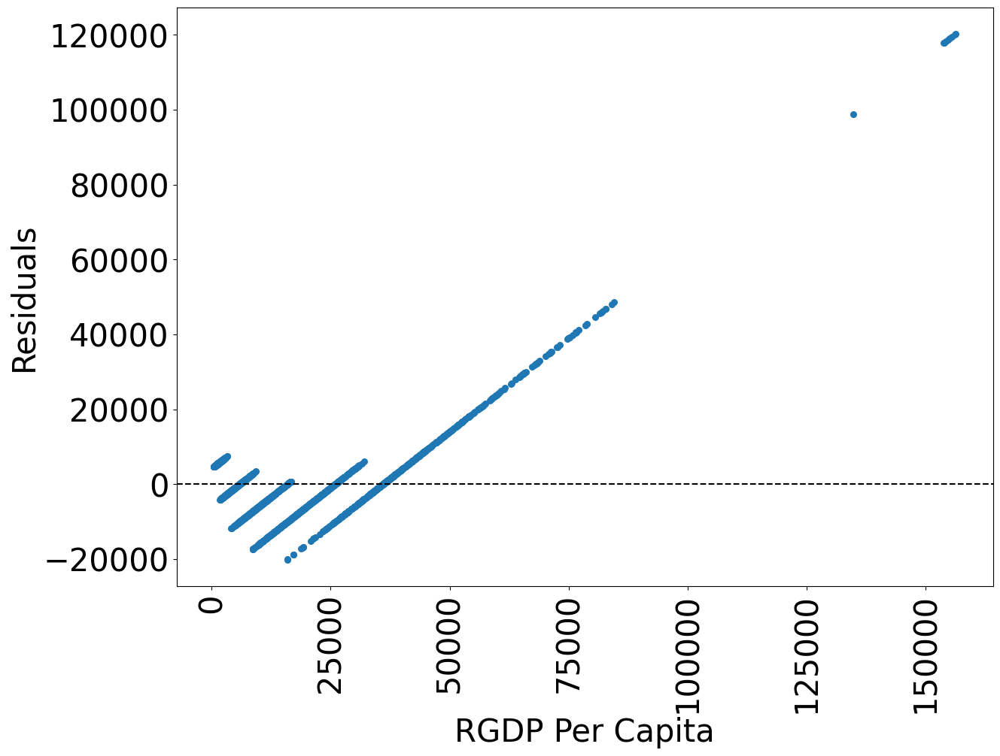

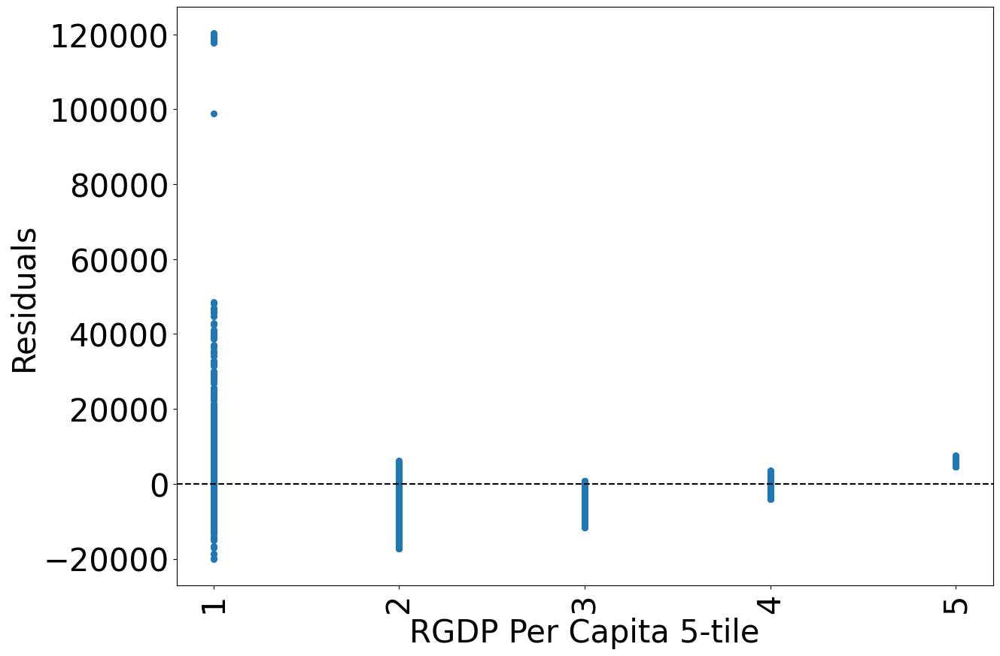

In [39]:
for entity in [True, False]:
    for time in [True, False]:
        reg_data = data.dropna()
        results = panel_regress(reg_data, X_names,
                               Y_NAME,
                               constant = True,
                               entity = entity,
                               time = time)
        reg_data["Predictor"] = results.predict()
        reg_data["Residuals"] = results.resids
        plot_residuals(reg_data, Y_NAME, X_names)